In [1]:
!sudo apt-get install -y fonts-nanum
!sudo fc-cache -fv
!rm ~/.cache/matplotlib -rf

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following NEW packages will be installed:
  fonts-nanum
0 upgraded, 1 newly installed, 0 to remove and 15 not upgraded.
Need to get 9,599 kB of archives.
After this operation, 29.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/universe amd64 fonts-nanum all 20180306-3 [9,599 kB]
Fetched 9,599 kB in 0s (40.1 MB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package fonts-nanum.
(Reading database ... 123069 files and dir

In [15]:
!pip install konlpy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
from wordcloud import WordCloud
from collections import Counter
from konlpy.tag import Okt
from PIL import Image
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

In [3]:
import os
import sys
import urllib.request
import json
import pandas as pd
import re
import joblib
import time
from google.colab import files

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **함수**

In [5]:
def cafe_nltk(df, column):
    result = []
    for temp in df[column]:
        kor_str = re.sub(r'[<b></b>&quot~&lt]', '', temp)
        result.append(kor_str)
    df[column] = result
    return df

In [6]:
# 사용시 본인의 client_id와 client_screat 사용
client_id = 
client_secret = 

In [7]:
def cafe_crawling(keyword):
    encText = urllib.parse.quote(keyword)

    result_list = []

    for i in range(1, 1000, 100):
        url = "https://openapi.naver.com/v1/search/cafearticle?query=" + encText + "&display=100&sort=sim&start=" + str(i)  # JSON 결과

        request = urllib.request.Request(url)
        request.add_header("X-Naver-Client-Id",client_id)
        request.add_header("X-Naver-Client-Secret",client_secret)

        response = urllib.request.urlopen(request)
        rescode = response.getcode()

        if(rescode==200):
            response_body = response.read()
            response_json = json.loads(response_body)

            result_data = response_json['items']

            for temp in result_data:
                cafe_data = {}

                cafe_title = temp['title']
                cafe_description = temp['description']
                cafe_link = temp['link']

                cafe_data['title'] = cafe_title
                cafe_data['description'] = cafe_description
                cafe_data['link'] = cafe_link

                result_list.append(cafe_data)

        else:
            print("Error Code:" + rescode)

    cafe = pd.DataFrame.from_dict(result_list)

    cafe_nltk(cafe, 'title')
    cafe_nltk(cafe, 'description')

    return cafe

In [8]:
def okts(df, column, keyword):
    str_list = []
    for temp in df[column]:
        str_list.append(temp)

    str = ''.join(str_list)

    okt = Okt()
    nouns = okt.nouns(str)
    pos = okt.pos(str, stem = True)
    morphs = okt.morphs(str)

    n_words = []
    for n in nouns:
        if len(n) > 1:
            n_words.append(n)

    p_words = []
    for p in pos:
        if len(p[0]) > 1 and 'Adjective' == p[1]:
            p_words.append(p[0])
        elif len(p[0]) > 1 and 'Verb' == p[1]:
            p_words.append(p[0])

    m_words = []
    for m in morphs:
        if len(m) > 1:
            m_words.append(m)


    n_c = Counter(n_words)
    p_c = Counter(p_words)
    m_c = Counter(m_words)
    delete_words = keyword.split(' ')

    for de_word in delete_words:
      del n_c[de_word]
      del p_c[de_word]
      del m_c[de_word]

    temp = sorted(n_c.items(), key = lambda x: x[1], reverse = True)
    n_c = dict(temp[20:])

    temp = sorted(p_c.items(), key = lambda x: x[1], reverse = True)
    p_c = dict(temp[20:])

    temp = sorted(m_c.items(), key = lambda x: x[1], reverse = True)
    m_c = dict(temp[20:])

    return n_c, p_c, m_c

In [9]:
plt.rc('font', family = 'NanumBarunGothic')

In [10]:
def wordclouds_gen(c):
    wc = WordCloud(font_path='NanumBarunGothic', width=1000, height=1000, scale=5.0, max_font_size=625, background_color = 'white')
    gen = wc.generate_from_frequencies(c)

    return gen

In [11]:
def wordclouds_maker(keyword, c1, c2, c3):
  gen1 = wordclouds_gen(c1)
  gen2 = wordclouds_gen(c2)
  gen3 = wordclouds_gen(c3)
  gen_list = [gen1, gen2, gen3]

  fig, axes = plt.subplots(1, 3, figsize=(15,10))
  for i, gen in enumerate(gen_list):
    axes[i].imshow(gen)
    axes[i].set_title(keyword + '에 대한 워드클라우드')
    axes[i].axis('off')

In [12]:
f_path = 'drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/'

def save_file_to_csv(df, f_path):
    file_name = input('확장자명을 제외한 파일 이름을 입력하세요: ')
    df.to_csv(os.path.join(f_path, file_name + '.csv'), index = False)
    time.sleep(10)

def save_jpgs(f_path):
  file_name = input('파일 이름을 입력해주세요: ')
  plt.savefig(f_path + file_name + '.jpg')

# **검색어: 우리 아들**

In [16]:
keyword = input('검색어를 입력해주세요: ')
my_son = cafe_crawling(keyword)
my_son

검색어를 입력해주세요: 우리 아들


,title,description,link
0,우리 아들 이쁘게 잘 만들어왔네요,응??우리아들 이게 뭐야??했거든요.. 그랬더니 씨익 웃으면서 저한테 주네요..ㅎㅎ...,http://cafe.naver.com/ungsangjang/609655
1,우리 아들 생일이자 입대100일 축하해,사랑한다 우리아들 나의 보물1호...엄마가 처음이라서 모자란게 많은것 같아. 군대를...,http://cafe.naver.com/army58cafe/574357
2,초6 우리아들 너무 안쓰럽네요,초6 우리아들 경계성이에요 회사에서 팀원이랑 애기하다보니 그팀원 아이도 6학년인데 ...,http://cafe.naver.com/getampethskin/975259
3,미용X 우리아들이 대상받았어요.,우리아들이 그림 그리기 대회 나가서 대상받았어요. 처음으로 느껴보는 감정이네요♡자랑...,http://cafe.naver.com/hk9344/279154
4,우리아들 시집가도 되겠…,냄비째 안 가져오고 그릇에 이쁘게 담아오고 ㅎㅍㅎ 우리 아들 시집가도 되겠 ㅎ ㅎ ...,http://cafe.naver.com/malltail/6748703
...,...,...,...
995,우리아들꿀잠ㅜㅋㅋ,자꾸 누가 뒤에 붙어자길래 남편인줄알았는데 눈떠보니 우리부비 이러고 이불덮고 주무시...,http://cafe.naver.com/corgilove/223001
996,우리 아들 친구는요..,선생님께서 우리아들의 표현력이 넘 좋다고 말씀하시더라구요 그 이유는..오늘 오후에 ...,http://cafe.naver.com/alba010/1615286
997,우리 아들 진열장,우리아들이 미니카 모으는걸 좋아합니다 그레서 진열장까지 따로만들었네요 좋은 희귀템이...,http://cafe.naver.com/tomyca/242124
998,고구마캐고 왔어요 우리아들 이쁘졍 ㅋ,점점 사랑스러워지는 우리아들 (아들사진은 펑했습니다) 잘생기고 이쁜얼굴은 아니지만 ...,http://cafe.naver.com/cafe1535/390923


In [ ]:
n_c, m_c = okts(my_son, 'description', keyword)

파일 이름을 입력해주세요: my_son_nouns


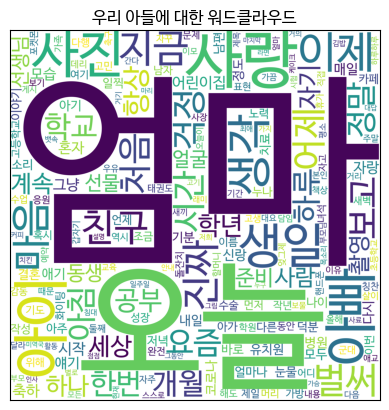

In [ ]:
wordclouds(n_c, keyword)
save_jpgs(f_path)

파일 이름을 입력해주세요: my_son_morphs


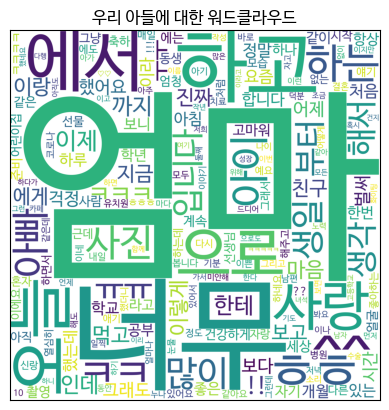

In [ ]:
wordclouds(m_c, keyword)
save_jpgs(f_path)

In [17]:
# csv 파일로 저장
save_file_to_csv(my_son, f_path)

확장자명을 제외한 파일 이름을 입력하세요: my_son_sentence


In [ ]:
my_son_df = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/my_son.csv')
my_son_df = my_son_df.dropna()

In [ ]:
n_c, p_c, m_c = okts(my_son_df, 'description', '우리 아들')

파일 이름을 입력해주세요: my_son


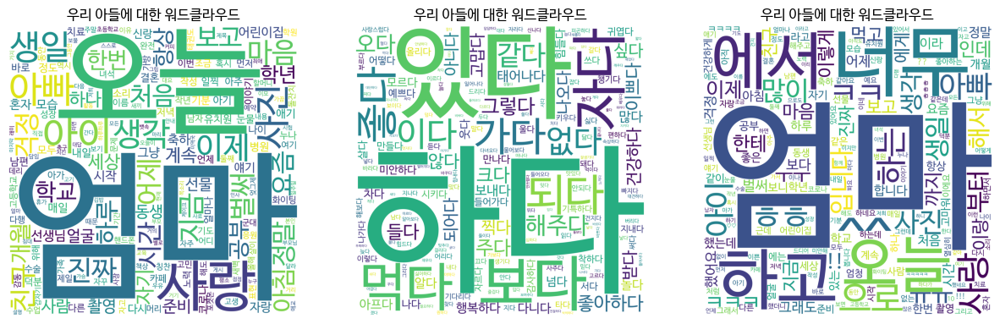

In [ ]:
wordclouds_maker('우리 아들', n_c, p_c, m_c)
save_jpgs(f_path)

# **검색어: 우리 딸**

In [18]:
keyword = input('검색어를 입력해주세요: ')
my_daughter = cafe_crawling(keyword)
my_daughter

KeyboardInterrupt: ignored

In [ ]:
n_c, m_c = okts(my_daughter, 'description', keyword)

파일 이름을 입력해주세요: my_daughter_nouns


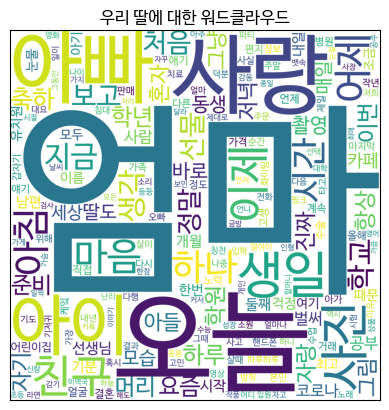

In [ ]:
wordclouds(n_c, keyword)
save_jpgs(f_path)

파일 이름을 입력해주세요: my_daughter_morphs


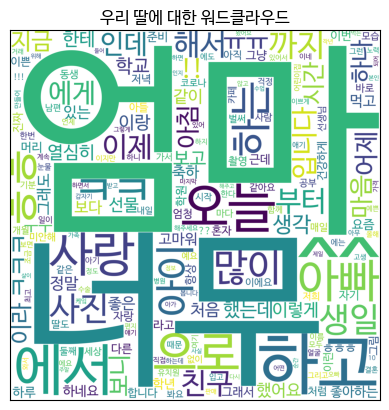

In [ ]:
wordclouds(m_c, keyword)
save_jpgs(f_path)

In [ ]:
# csv 파일로 저장
save_file_to_csv(my_daughter, f_path)

확장자명을 제외한 파일 이름을 입력하세요: my_daughter


In [ ]:
my_daughter_df = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/my_daughter.csv')
my_daughter_df = my_daughter_df.dropna()

In [ ]:
n_c, p_c, m_c = okts(my_daughter_df, 'description', '우리 딸')

파일 이름을 입력해주세요: my_daughter


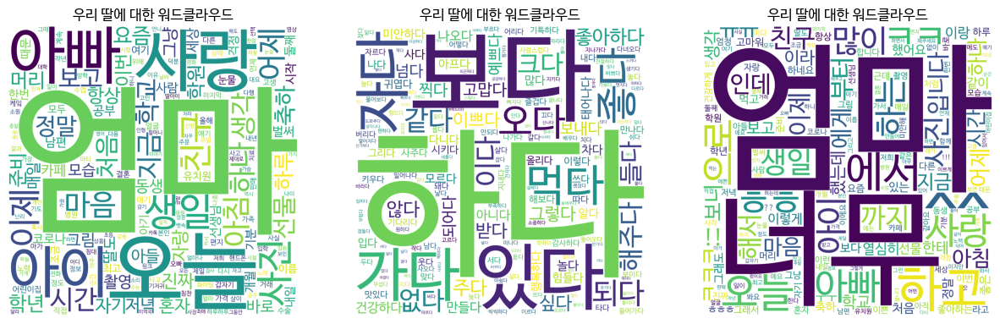

In [ ]:
wordclouds_maker('우리 딸', n_c, p_c, m_c)
save_jpgs(f_path)

# **검색어: 사춘기**

In [ ]:
keyword = input('검색어를 입력해주세요: ')
adolescence = cafe_crawling(keyword)
adolescence

검색어를 입력해주세요: 사춘기


,title,description,link
0,사춘기샴푸 유분 잘 잡아요,사춘기 샴푸 유분 잘 잡아요 저희 아이는 성장기를 지나고 있어서 그런지 아침 저녁으...,http://cafe.naver.com/culturebloom/1937680
1,사춘기샴푸 개운하네요,위해서 사춘기샴푸를 골라봤는데요 아이 본인도 사춘기샴푸를 여기저기 찾아봤는지 여기서...,http://cafe.naver.com/miznett/3765201
2,사춘기 아이가있는집입니다,사춘기로반항은하지만 저와 트러블 때문인지 자꾸 애착이불처럼 작은 이불을 덥고자는모습...,http://cafe.naver.com/dogpalza/18097912
3,사춘기샴푸 세정 잘돼요,사춘기 샴푸 세정 잘돼요 저희 동생은 호르몬 변화가 뿜뿜하는 성장기를 지나고 있는 ...,http://cafe.naver.com/06rkddkwl/1995384
4,사춘기 남매 키우시는 분들,ㅡㅡ) 사춘기 접어드니 더 말수가 없어지고 집에서도 밥먹는 시간 외에는 방에만 주로...,http://cafe.naver.com/remonterrace/30778049
...,...,...,...
995,사춘기를 위한 관점수업,이번책은 곧 사춘기가 올 중학생아이를 위한 책이기도 해요 앞으로 아이에게 올 수많은...,http://cafe.naver.com/mom79/1052053
996,사춘기 아들들과의 의로운 저녁 나들이,정말 오랜만입니다 사춘기 두 아들들과 함께 저녁을 먹다니요 게다가 무려 외식까지 하...,http://cafe.naver.com/veryup/136770
997,서점갔다가 사춘기딸 책선물 샀네요,제목도 넘 맘에 들어 사춘기 호되게 하고있는 딸 선물로 하나 샀네요 엄마마음은 여기...,http://cafe.naver.com/lol2580/1669254
998,사춘기,나무님들 사춘기 씨게 겪으셨나요?? 전 사춘기라곤 일도 없던 아주 착한넘 이였죠 저...,http://cafe.naver.com/parknansa/1103894


In [ ]:
n_c, m_c = okts(adolescence, 'description', keyword)

파일 이름을 입력해주세요: adolescence_nouns


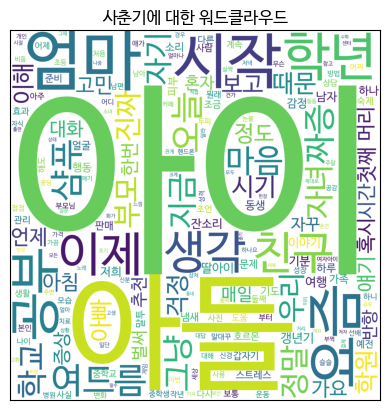

In [ ]:
wordclouds(n_c, keyword)
save_jpgs(f_path)

파일 이름을 입력해주세요: adolescence_morphs


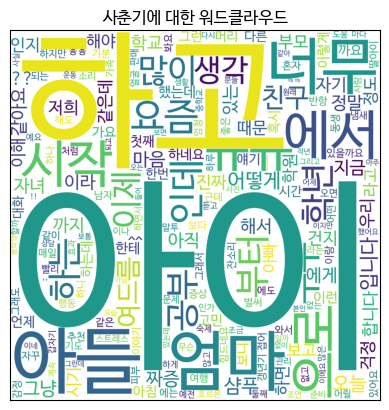

In [ ]:
wordclouds(m_c, keyword)
save_jpgs(f_path)

In [ ]:
# csv 파일로 저장
save_file_to_csv(adolescence, f_path)

확장자명을 제외한 파일 이름을 입력하세요: adolescence


In [ ]:
adolescence_df = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/adolescence.csv')
adolescence_df = adolescence_df.dropna()

In [ ]:
n_c, p_c, m_c = okts(adolescence_df, 'description', '사춘기')

파일 이름을 입력해주세요: adolescence


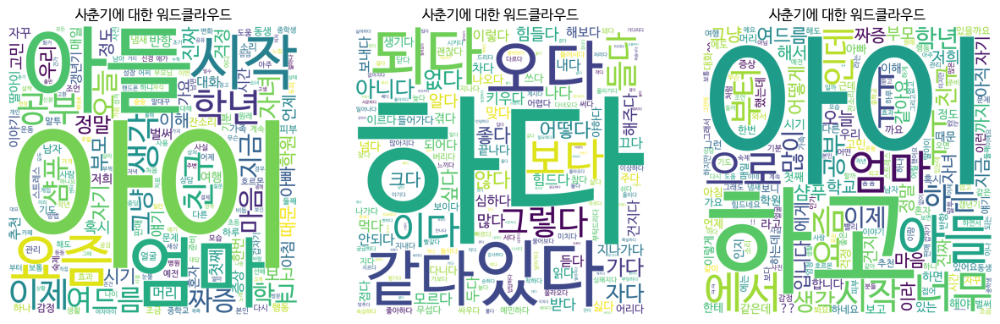

In [ ]:
wordclouds_maker('사춘기', n_c, p_c, m_c)
save_jpgs(f_path)

# **검색어: ADHD**

In [ ]:
keyword = input('검색어를 입력해주세요: ')
adhd = cafe_crawling(keyword)
adhd

검색어를 입력해주세요: adhd


,title,description,link
0,adhd확정 아닌 의심단계에서 약물복용시키나요,의심단계인데 약물얘기꺼내셔서 놀랐어요 adhd진단받으신분들 지적자폐검사말고 더 디테...,http://cafe.naver.com/getampethskin/974218
1,마음아픈 일주일이 지나가요(틱)(긴글주의)adhd궁금해요,(아빌) adhd가능성제기 금욜 오후 한의원상담 ㅡ 위의 증상 동일 금욜 저녁 ㅡ ...,http://cafe.naver.com/getampethskin/973937
2,ADHD 약물치료,중2 검사걸과 ADHD를 배재할수없다라는 결과가 작년 검사에서 나왔었는데요 요새 저...,http://cafe.naver.com/009955/6915
3,집책상에서 자꾸 일어나고 연필떨어뜨리는거도 adhd 일까요,떨어뜨리고 34번 가끔은 물컵도 엎지르고 adhd증상항목에는 이런거있던거 같은데이거...,http://cafe.naver.com/sjmoms/1978942
4,adhd 검사?,생각했을때 adhd?인가? 정신과가서 검사 받아받야겠죠? 정신과 가서 검사 받으면 ...,http://cafe.naver.com/msbabys/4568554
...,...,...,...
995,느려터짐도 adhd증상인가요?,교수님은 웩슬러랑 ca검사 결과만을 보고 adhd라고 약 먹어야한다고 하시는데 저는...,http://cafe.naver.com/getampethskin/908625
996,adhd 병원 질문합니다,아이가 집중력이 너무 낮기도 하고 손톱을 계속 만지작 만지작해요 근데 이게 제가 혼...,http://cafe.naver.com/getampethskin/896772
997,adhd인 아이는 어떤 곳을 가야 할까요??,집에서는 상호작용이 잘되고 지시도 잘 따릅니다 외동이지만 친척들 만나면 싸움없이 같...,http://cafe.naver.com/getampethskin/927644
998,토끼맘 + ADHD + 52개월차 엄마에요,쨋든 지능부분은 평균 이상이다 라고 나왔고요 여기 임상심라사 께서 평가시 아이의 산...,http://cafe.naver.com/getampethskin/917211


In [ ]:
n_c, m_c = okts(adhd, 'description', keyword)

파일 이름을 입력해주세요: adhd_nouns


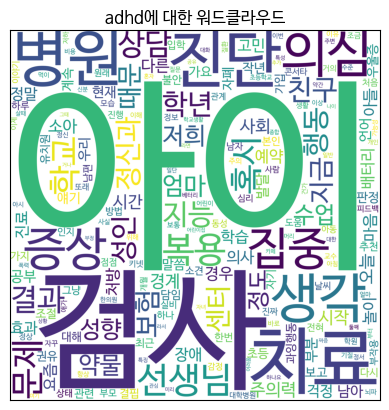

In [ ]:
wordclouds(n_c, keyword)
save_jpgs(f_path)

파일 이름을 입력해주세요: adhd_morphs


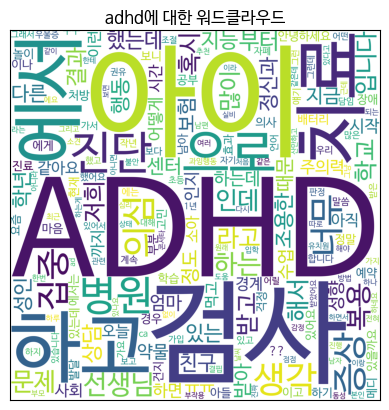

In [ ]:
wordclouds(m_c, keyword)
save_jpgs(f_path)

In [ ]:
# csv 파일로 저장
save_file_to_csv(adhd, f_path)

확장자명을 제외한 파일 이름을 입력하세요: adhd


In [ ]:
adhd_df = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/adhd.csv')
adhd_df = adhd_df.dropna()

In [ ]:
n_c, p_c, m_c = okts(adhd_df, 'description', 'ADHD')

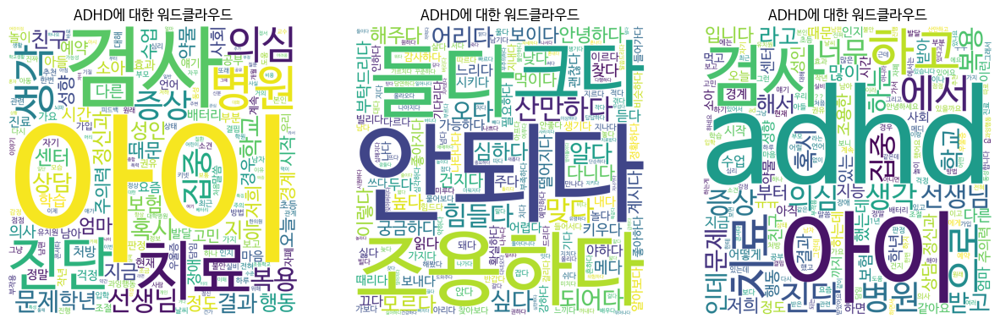

In [ ]:
wordclouds_maker('ADHD', n_c, p_c, m_c)

파일 이름을 입력해주세요: adhd


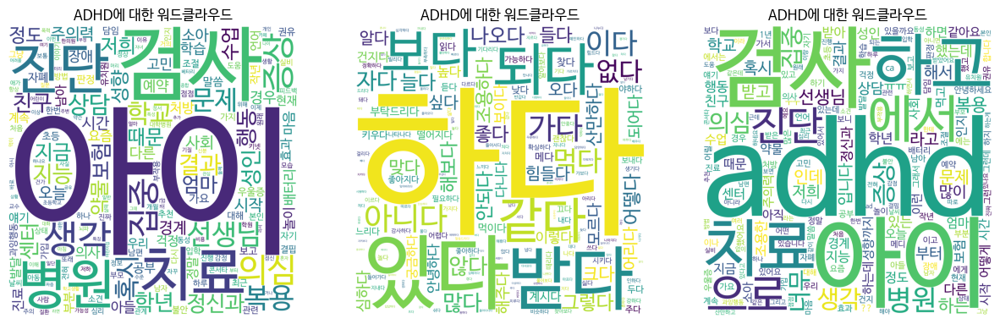

In [ ]:
wordclouds_maker('ADHD', n_c, p_c, m_c)
save_jpgs(f_path)

# **검색어: 중2병**

In [ ]:
keyword = input('검색어를 입력해주세요: ')
middle2 = cafe_crawling(keyword)
middle2

검색어를 입력해주세요: 중2병


,title,description,link
0,고1도 중2병처럼 뭐있나요??,중간고사 망쳐서그런지 ㅠ 공부도안하고 자꾸저랑싸우게되네요 말도안듣고 ㅠ 고1도 중2...,http://cafe.naver.com/goldschools/781654
1,중2병 있는 친구들 공부는 어떤가요? 고등학교 가면 맘 잡을지 궁금합니다ㅠㅠ,"중2병을 앓고 있는 아들이에요 (병증은 허세, 겉멋, 귀차니즘, 내가 알아서할께, ...",http://cafe.naver.com/mathall/2638564
2,중2병 초6사춘기,생각해야는건가 그래도 무조건 응원해줘야지요 멘탈강화가 무조건적으로 필요해요 학원이라...,http://cafe.naver.com/hangamo/197518
3,중2병,중2병 자녀가 있으신가요? 그냥 다 겪는 질풍노도라고 생각했는데 너무 심각하면 상담...,http://cafe.naver.com/usem/2055787
4,중2병 언젠가는 끝나겠지요,중2병 말도 밉게하고 자기중심적이고 방문닫고 통화하다가 새벽에자고 오늘은 담배피는...,http://cafe.naver.com/009955/6709
...,...,...,...
995,중2병!!,중2병 델피나! 데우스의 눈 위치를 생각하면 안대가 오른쪽이여하지만 그냥 해요,http://cafe.naver.com/taleshop/101218
996,이번주도 신나게 무쇠랑 놀았습니다,단무공에 솥만 검색하고 집착이 심해지네요 솥밥도 해먹고 중2병 이쁜소녀는 하트 김볶...,http://cafe.naver.com/mushei/90157
997,중2병,차차 보면서 하는거야 ㅇㅇ 지금은 중2병 십화까지봄ㅇㅇㅇ,http://cafe.naver.com/bestani/3916070
998,중2병극장판보고왔는데,오늘 칭구들과함께 중2병극장판을보러 코엑스매가박스까지갔습니다 하하 극장판보면 클리어...,http://cafe.naver.com/wotat/590774


In [ ]:
n_c, m_c = okts(middle2, 'description', keyword)

파일 이름을 입력해주세요: middle2_nouns


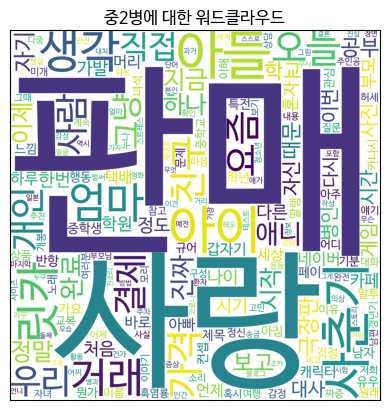

In [ ]:
wordclouds(n_c, keyword)
save_jpgs(f_path)

파일 이름을 입력해주세요: middle2_morphs


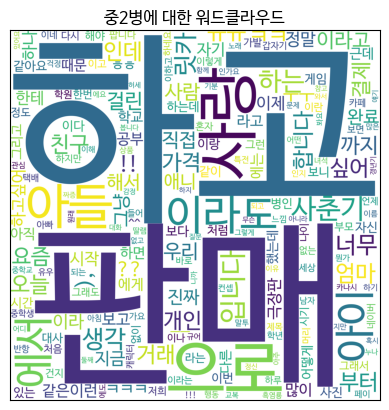

In [ ]:
wordclouds(m_c, keyword)
save_jpgs(f_path)

In [ ]:
# csv 파일로 저장
save_file_to_csv(middle2, f_path)

확장자명을 제외한 파일 이름을 입력하세요: middle2


In [ ]:
middle2_df = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/middle2.csv')
middle2_df = middle2_df.dropna()

In [ ]:
n_c, p_c, m_c = okts(middle2_df, 'description', '중2병')

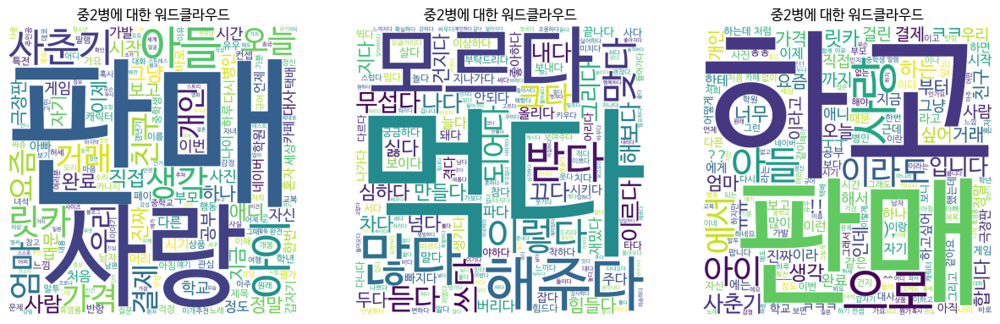

In [ ]:
wordclouds_maker('중2병', n_c, temp, m_c)

# **검색어: 왕따**

In [ ]:
keyword = input('검색어를 입력해주세요: ')
bully = cafe_crawling(keyword)
bully

검색어를 입력해주세요: 왕따


,title,description,link
0,왕따 사건,명을 왕따시키는 걸 처음 목격하고 정신적 충격에서 벗어나지 못하고 있다가 얼마전 단...,http://cafe.naver.com/infj/26455
1,제주의 멋스런 왕따나무,비오는 아침 드라이브겸 꼭 보고싶었던 왕따나무 보고 왔네요 사진으로만 보았던 넓은 ...,http://cafe.naver.com/hkct/1048229
2,애들만 왕따가 있는게,아니네요 다 큰 어른들도 왕따를 시키고 주도하고 직장내에도 그런게 있다는게 그저 놀...,http://cafe.naver.com/pusanmom/3853651
3,등기부등본 떼보고 왕따 시킨다는 기사 보고,등본 떼보고 왕따 시킨다는 강남 초딩들 기사를 보니 어릴때 기억이 생각 났어요 hp...,http://cafe.naver.com/gloseems1/908630
4,왕따 은따 대처법,초6 여자아이를 둔 엄마입니다 요즘 티비에서 자꾸 왕따 은따 자살 이런 것들이 보도...,http://cafe.naver.com/seochom/871262
...,...,...,...
995,왜 계속 일찐패는 왕따 웹툰이 나오는거냐,맨날 웹툰광고보면 일찐패는 왕따 뭐 존나쌘 왕따 힘을숨기는 왕따 이름만다르지 다 소...,http://cafe.naver.com/playbattlegrounds/3342393
996,내 남편과 팔짱낀 여자와 다툰 후 학교 엄마들 사이에서 저 왕따가 되었더라구요,은따 왕따 당하는 엄마가 되어있네요 같이 다니는 학원 엄마들도 눈길도 피하고 안보고...,http://cafe.naver.com/remonterrace/29418558
997,전 몰랐는데 제가 왕따였나봐요,싱글맘으로써 까페알바하며 겨우 입에 풀칠하며 육아하는 컨셉이였는데 이웃이 저보고 왕...,http://cafe.naver.com/worldssims2/697759
998,아이왕따어떻게해결하면좋을까요?,그로써 큰애가 많이속상해하고 다른친구들과 어울리지도 못하고 애들이 저희애를계속 왕따...,http://cafe.naver.com/gyeyanggulife/317851


In [ ]:
n_c, m_c = okts(bully, 'description', keyword)

파일 이름을 입력해주세요: bully_nouns


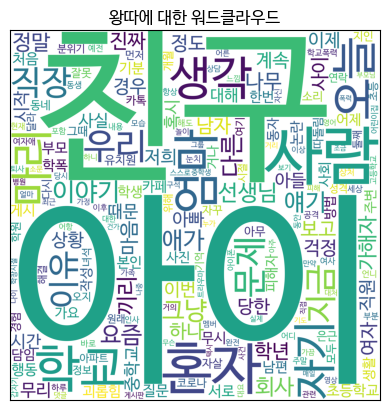

In [ ]:
wordclouds(n_c, keyword)
save_jpgs(f_path)

파일 이름을 입력해주세요: bully_morphs


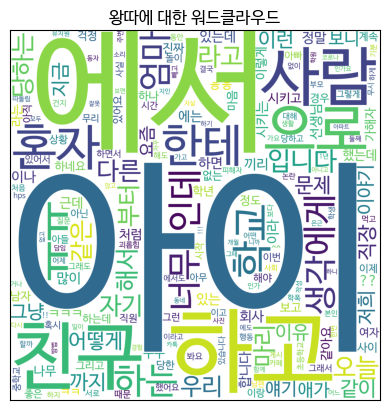

In [ ]:
wordclouds(m_c, keyword)
save_jpgs(f_path)

In [ ]:
# csv 파일로 저장
save_file_to_csv(bully, f_path)

확장자명을 제외한 파일 이름을 입력하세요: bully


In [ ]:
bully_df = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/bully.csv')
bully_df = bully_df.dropna()

In [ ]:
n_c, p_c, m_c = okts(bully_df, 'description', '왕따')

파일 이름을 입력해주세요: bullly


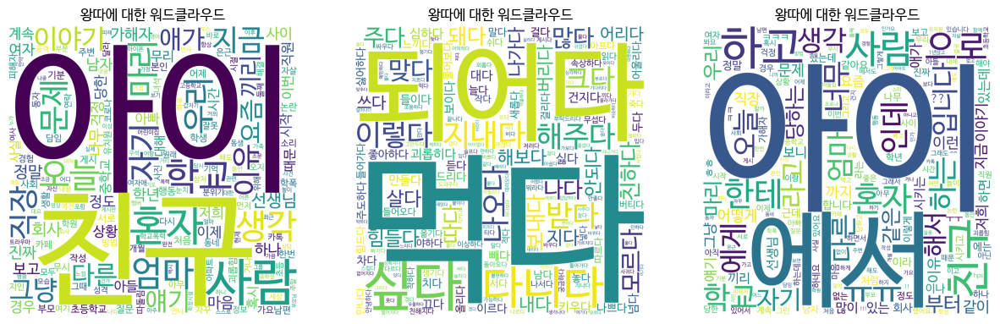

In [ ]:
wordclouds_maker('왕따', n_c, p_c, m_c)
save_jpgs(f_path)

# **검색어: 따돌림**

In [ ]:
keyword = input('검색어를 입력해주세요: ')
bully_2 = cafe_crawling(keyword)
bully_2

검색어를 입력해주세요: 따돌림


,title,description,link
0,따돌림은 어떻게 하나요,따돌림은 어떻게 저희가 이걸 입증하나요 다수의 몇명이 아니라 반아이들이 거의 그래요...,http://cafe.naver.com/choichulsoo/16247
1,"초등 저학년 따돌림, 담임이 알까요","3달 가까이 이어져온 따돌림이고 교실 내에서 따돌림, 괴롭힘이 이루어졌어요 아이 물...",http://cafe.naver.com/malltail/6738662
2,"따돌림, 왕따 기준이 뭐에요?",진짜 미취학때 육아는 육아도 아니에요ㅠㅠ 초 고학년 되니까 친구들 관계땜에 아이가 ...,http://cafe.naver.com/kyungmammo/5991907
3,학교에서 따돌림을 받고 있어요 어떻게 해야 하나요?ㅠ,드렸는데 따돌림 당한 아이가 저희 아이뿐 아니라 다른 친구도 겪고 있어서 학교에서도...,http://cafe.naver.com/gloseems1/909284
4,6세여아 따돌림문제,그런데 저희아파트에 유치원 같은반여아가 저희딸포함 3명이 사는데 셋이있을때 저희딸이...,http://cafe.naver.com/remonterrace/30700650
...,...,...,...
995,집단따돌림 주장 올리겠습니다!!!-경진-ㅎ,제목 : 집단 따돌림 요즘 따돌림을 당하는 아이가 늘어나고 있습니다 따돌림을 당하면...,http://cafe.naver.com/rnvudch61/109
996,구피 따돌림?,어제 데리고왔고 어제부터 수놈들끼리 싸우더니 오늘 좀 더 작은 수놈이 혼자다니네요 ...,http://cafe.naver.com/hby/2394160
997,우울증이 참 무섭네요,계룡에 국공립어린이집에서 주임교사가 다른 선생들 따돌림이랑 괴롭힘에 우울증와서 아파...,http://cafe.naver.com/no1sejong/3585163
998,친구가 신발을 밟았다고 전화왔어요 어쩌죠?,못본아이는울고요 근데 따돌림?당한그아이가 제아이예요 B가 저희아이랑 수틀리고싸우고 ...,http://cafe.naver.com/imsanbu/65725175


In [ ]:
n_c, m_c = okts(bully_2, 'description', keyword)

파일 이름을 입력해주세요: bully_2_nouns


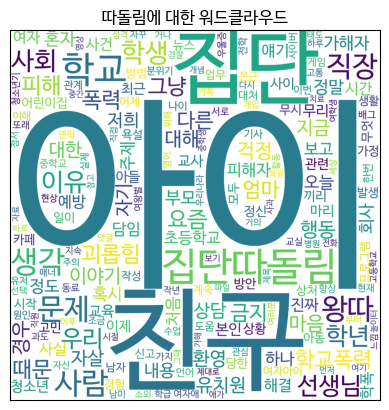

In [ ]:
wordclouds(n_c, keyword)
save_jpgs(f_path)

파일 이름을 입력해주세요: bully_2_morphs


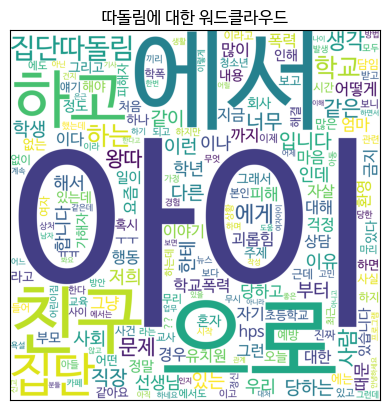

In [ ]:
wordclouds(m_c, keyword)
save_jpgs(f_path)

In [ ]:
# csv 파일로 저장
save_file_to_csv(bully_2, f_path)

확장자명을 제외한 파일 이름을 입력하세요: bully_2


In [ ]:
bully_2_df = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/bully_2.csv')
bully_2_df = bully_2_df.dropna()

In [ ]:
n_c, p_c, m_c = okts(bully_2_df, 'description', '따돌림')

파일 이름을 입력해주세요: bully_2


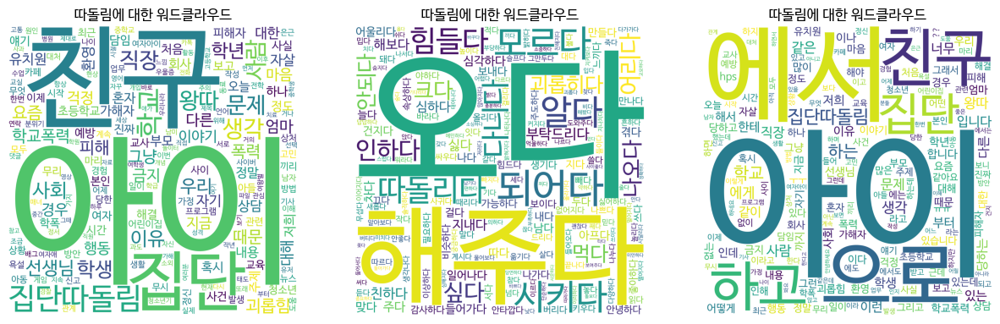

In [ ]:
wordclouds_maker('따돌림', n_c, p_c, m_c)
save_jpgs(f_path)

# **검색어: 사이버 폭력**

In [ ]:
keyword = input('검색어를 입력해주세요: ')
cyber_bully = cafe_crawling(keyword)
cyber_bully

검색어를 입력해주세요: 사이버 폭력


,title,description,link
0,사이버폭력 및 성범죄예방 교육-만정초등학교,안녕하세요^^ 내일 만정초등학교에서 사이버 폭력 및 성범죄예방교육이있습니다 초등학교...,http://cafe.naver.com/gongdomom/271712
1,사이버폭력 예방교육 주간 운영 계획,처음 글 올려봅니다 여기 올려진 자료로 업무에 많은 도움을 받고 있습니다^^ 첨부파...,http://cafe.naver.com/edu666/98197
2,사이버폭력 해결방안 일단 확인하세요,"사이버폭력 해결방안 물론 여러분들은 학교폭력 사건이기에, 내 아이의 생각도 고려를 ...",http://cafe.naver.com/freegunzblack/4769
3,사이버폭력 사례 전문가가 알려드려요,"사이버폭력 사례 경리횡령, 가중처벌 받을 수 있기에 횡령사건은 시간이 가장 중요합니...",http://cafe.naver.com/freegunzblack/4768
4,2023 사이버폭력예방주간 운영 계획,첨부파일 2023 정보통신윤리교육 및 사이버폭력예방주간 운영 계획hwp 파일 다운로드,http://cafe.naver.com/edu666/98166
...,...,...,...
995,연간학교폭력업무 정리,"학폭 예방 수업 증거자료 필요 * 교직원 대상 학교폭력예방교육, 아동학대예방교육 실...",http://cafe.naver.com/edu666/75273
996,2017 사이버폭력예방 드림업,청소년들의 위해 미래를 경우 주로 초등학생들을 진행됩니다 지난 오후 서울여자중학교에...,http://cafe.naver.com/cafucino/2187
997,"호이에듀-충주 대림초등학교 학교폭력예방교육 마술극,언어폭력,성폭력,사이버 폭력 예방교육","호이에듀-충주 대림초등학교 학교폭력예방교육 마술극,언어폭력,성폭력,사이버 폭력 예방...",http://cafe.naver.com/hoyedu/2285
998,학교폭력 관련 자료,첨부파일 사이버 폭력 예방 교육 자료hwp 파일 다운로드,http://cafe.naver.com/edu666/79344


In [ ]:
n_c, m_c = okts(cyber_bully, 'description', keyword)

파일 이름을 입력해주세요: cyber_bully_nouns


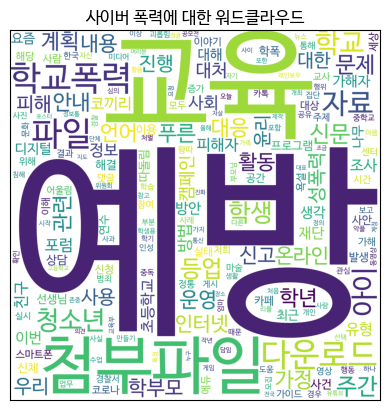

In [ ]:
wordclouds(n_c, keyword)
save_jpgs(f_path)

파일 이름을 입력해주세요: cyber_bully_morphs


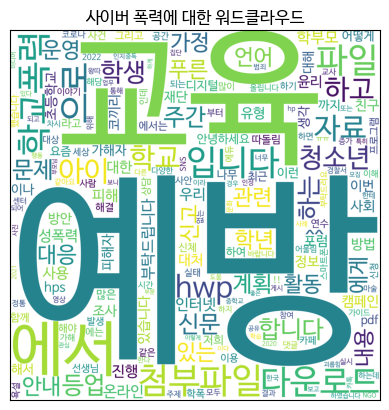

In [ ]:
wordclouds(m_c, keyword)
save_jpgs(f_path)

In [ ]:
# csv 파일로 저장
save_file_to_csv(cyber_bully, f_path)

확장자명을 제외한 파일 이름을 입력하세요: cyber_bully


In [ ]:
cyber_bully_df = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/cyber_bully.csv')
cyber_bully_df = cyber_bully_df.dropna()

In [ ]:
n_c, p_c, m_c = okts(cyber_bully_df, 'description', '사이버폭력')

파일 이름을 입력해주세요: cyber_bully


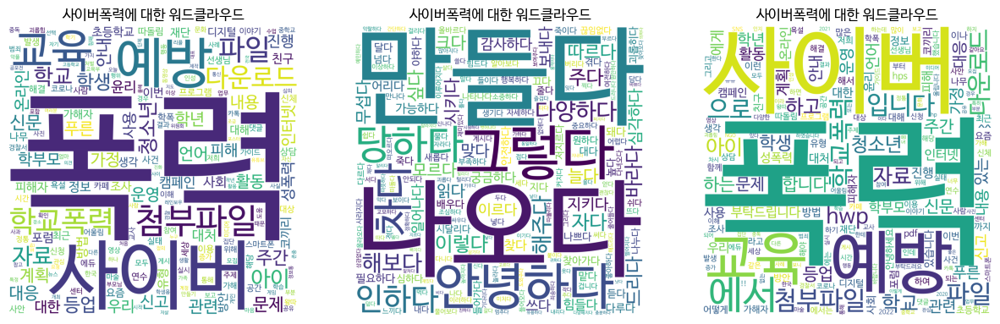

In [ ]:
wordclouds_maker('사이버폭력', n_c, p_c, m_c)
save_jpgs(f_path)

# **검색어: 아이 문제**

In [ ]:
keyword = input('검색어를 입력해주세요: ')
kids_problem = cafe_crawling(keyword)
kids_problem

검색어를 입력해주세요: 아이 문제


,title,description,link
0,6세 아이 문제랍니다ㅠㅠ,저희가 이사온지 벌써 두달이 되가네요 문제는 두둥 아이가 얼집에 안가요ㅠㅠ 점점고집...,http://cafe.naver.com/pangyomommy/570055
1,아이 문제로 질문드려요,"아님그냥 조용히 넘어가야할까요? 참고로 처음에 아이가, 전학가고싶다고해서 문제가있나...",http://cafe.naver.com/yangmom/573559
2,문제 안 읽고 푸는 아이어찌 고치나요?,초3 남자 아이 문제를 안 읽고 왜 문제를 본인 스스로 이상하게 생각해서 푸는걸까요...,http://cafe.naver.com/jinheemom/2509485
3,초등2 아이문제 담임선생님께 편지?전화? 카톡 뭐가나을까요?,아이의 기질적 문제 인가 싶어 심리 상담도 받아볼까 하는데 학업적인거 말고는 괜찮은...,http://cafe.naver.com/kyungmammo/6009087
4,안녕하세요 아이 문제로 처음 여쭤보아요!!!,할 이야기들은 많지만 우선 최근 문제되는 상황들에 대해 상담을 드려볼까해요 첫번재는...,http://cafe.naver.com/asperger/109372
...,...,...,...
995,백일전후 아이는 보통 어떤 수면 문제를 겪고 있을까요?,남고 어떤 문제인 지 이제 기억이 너무 가물가물하네요 ㅠㅠㅠㅠ 그래서 현재 백일전후...,http://cafe.naver.com/imsanbu/66178897
996,이혼얘기 나왔는데 이런경우 어찌하나요?(아이문제),이혼얘기는 나왔는데 아이아빠는 아이를 데려간다 전 아이는 못보낸다 입니다 아이 데려...,http://cafe.naver.com/imsanbu/61701786
997,초2 아이 친구문제 봐주세요,별거 아닐 수도 있지만 저는 그 아이의 그런 태도가 잘못된거라고 살짝 발끈했어요 같...,http://cafe.naver.com/mom79/1062869
998,아이 수면 문제휴,몇달에 한번씩 주기적으로새벽에 한두번씩 깨요ㅠ 근데 깨서 다시 금방 잠들면 문제없는...,http://cafe.naver.com/momsofsongdoifez/981385


In [ ]:
n_c, m_c = okts(kids_problem, 'description', keyword)

파일 이름을 입력해주세요: kids_problem_nouns


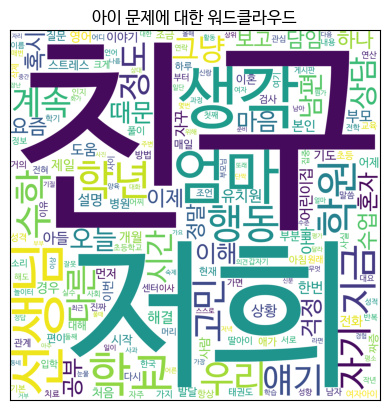

In [ ]:
wordclouds(n_c, keyword)
save_jpgs(f_path)

파일 이름을 입력해주세요: kids_problem_morphs


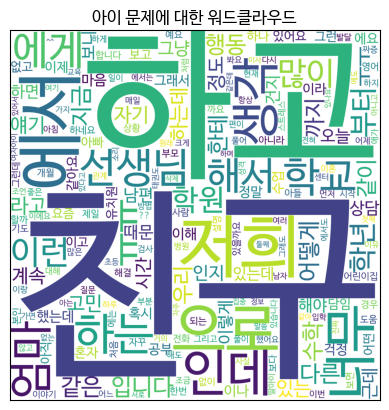

In [ ]:
wordclouds(m_c, keyword)
save_jpgs(f_path)

In [ ]:
# csv 파일로 저장
save_file_to_csv(kids_problem, f_path)

확장자명을 제외한 파일 이름을 입력하세요: kids_problem


In [ ]:
kids_problem_df = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/kids_problem.csv')
kids_problem_df = kids_problem_df.dropna()

In [ ]:
n_c, p_c, m_c = okts(kids_problem_df, 'description', '아이 문제')

파일 이름을 입력해주세요: kids_problem


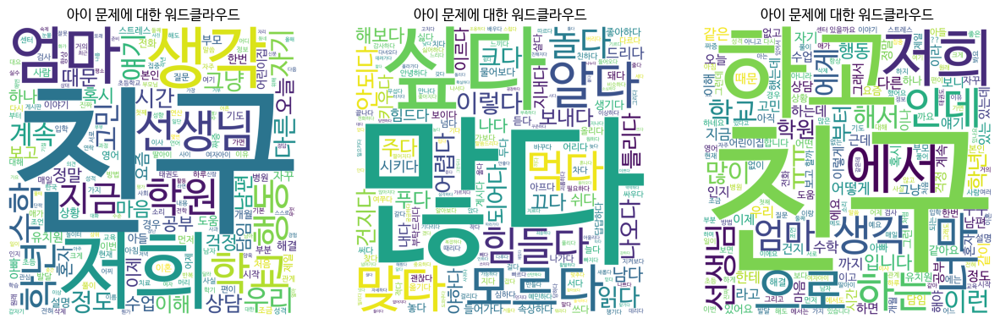

In [ ]:
wordclouds_maker('아이 문제', n_c, p_c, m_c)
save_jpgs(f_path)

# **검색어: 금쪽이**

In [ ]:
keyword = input('검색어를 입력해주세요: ')
golden_kids = cafe_crawling(keyword)
golden_kids

검색어를 입력해주세요: 금쪽이


,title,description,link
0,우리집 금쪽이,즤집엔 금쪽이가 2분 한명은 아들내미(중1) 한마리 는 콩 금쪽이라 상전대하듯 뫼셔...,http://cafe.naver.com/clubpet/4412379
1,금쪽같은 내 새끼 초4 금쪽이 경악 폭발각 아녜요?,오늘 금쪽같은 내새끼 금쪽이는 초4여자친구네요 저희딸이랑 동갑이구만요 근데 금쪽이의...,http://cafe.naver.com/ungsangjang/611032
2,오늘 금쪽이 말투요,저희아이랑 말하는 느낌이 완전 똑같아서요 저는 그래서 금쪽이가 얘기하는거 다 알아들...,http://cafe.naver.com/getampethskin/973878
3,금쪽이 보는데와ㅜㅜ,금쪽이 보는데 화가 부글부글 진짜아무리 상처가 많고 엄마가 할머니께서 잘못한게 있더...,http://cafe.naver.com/pianisthb/1497191
4,오늘 금쪽이,지난주에 이어 오늘 금쪽이 정말 할 말이 없네요 금쪽이 보시는 분 안계신가요? 도대...,http://cafe.naver.com/seochom/872326
...,...,...,...
995,몇살까지 밖에서 아이를 안고 업어주고 그러셨나요??(금쪽이기사 보다가 궁금해서요^^),저도 6세 딸 하나 키우는데 아직 키나 몸무게가 적게나가기도해서(무겁지않아서^^) ...,http://cafe.naver.com/no1sejong/3462099
996,금쪽이케어 너무감사했습니다,고민했는데 금쪽이케어에서 좋은 이모님 만나서 너무행복했어요 음식도 너무맛있었고 아침...,http://cafe.naver.com/imsanbu/57477022
997,금쪽이!,생명력으로 다시 살아나려 뿌리 하나를 보여줍니다 그리고 나 부활했어요!!하며 미니미...,http://cafe.naver.com/diyhouses/25768
998,금쪽이 보고왔어요ㅜㅠ,금쪽이가 아빠는 안돼라는 말을 많이하고 엄마아빠는 자주 다투시고 동생이 괴롭힌다고 ...,http://cafe.naver.com/byungs94/6598717


In [ ]:
n_c, m_c = okts(golden_kids, 'description', keyword)

파일 이름을 입력해주세요: golden_kids_nouns


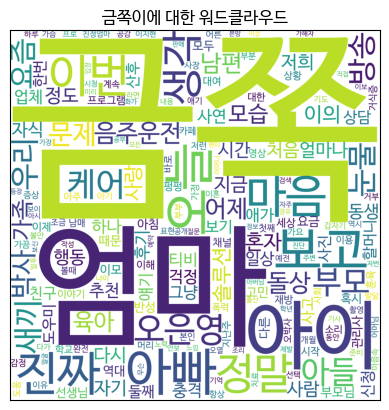

In [ ]:
wordclouds(n_c, keyword)
save_jpgs(f_path)

파일 이름을 입력해주세요: golden_kids_morphs


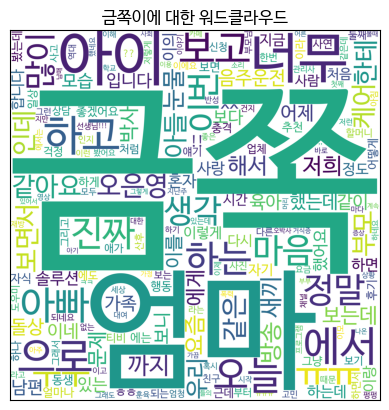

In [ ]:
wordclouds(m_c, keyword)
save_jpgs(f_path)

In [ ]:
# csv 파일로 저장
save_file_to_csv(golden_kids, f_path)

확장자명을 제외한 파일 이름을 입력하세요: golden_kids


In [ ]:
golden_kids_df = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/golden_kids.csv')
golden_kids_df = golden_kids_df.dropna()

In [ ]:
n_c, p_c, m_c = okts(golden_kids_df, 'description', '금쪽이')

파일 이름을 입력해주세요: golden_kids


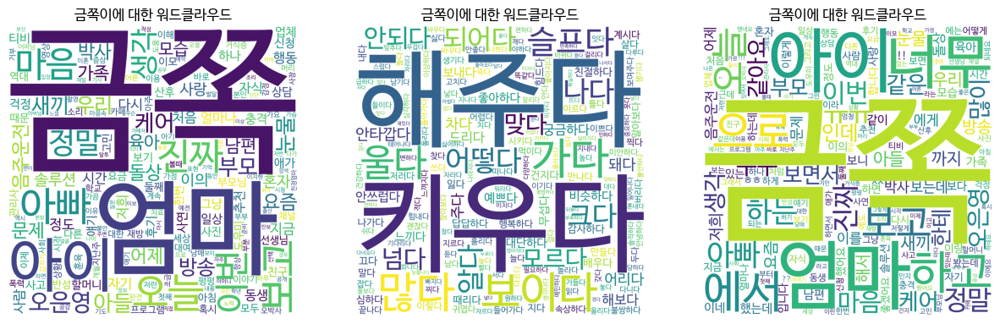

In [ ]:
wordclouds_maker('금쪽이', n_c, p_c, m_c)
save_jpgs(f_path)

# **조사파일 전부 합친 후 조사**

In [ ]:
csv1 = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/my_son.csv')
csv2 = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/middle2.csv')
csv3 = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/kids_problem.csv')
csv4 = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/golden_kids.csv')
csv5 = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/cyber_bully.csv')
csv6 = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/bully_2.csv')
csv7 = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/bully.csv')
csv8 = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/adolescence.csv')
csv9 = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/adhd.csv')

In [ ]:
csv_all = pd.concat([csv1, csv2, csv3, csv4, csv5, csv6, csv7, csv8, csv9], axis = 0)

In [ ]:
csv_all = csv_all.dropna()

In [ ]:
n_c, m_c = okts(csv_all, 'description', keyword)

파일 이름을 입력해주세요: search_all_nouns


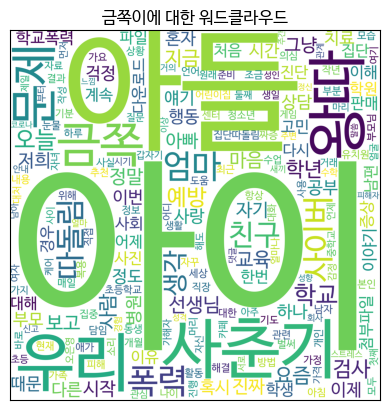

In [ ]:
wordclouds(n_c, keyword)
save_jpgs(f_path)

파일 이름을 입력해주세요: search_all_morphs


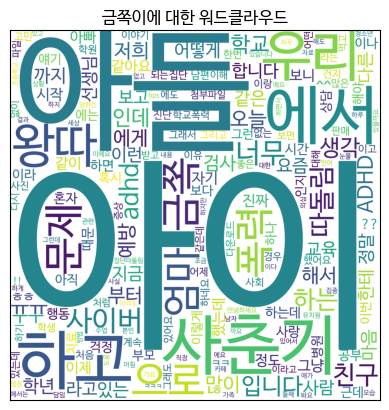

In [ ]:
wordclouds(m_c, keyword)
save_jpgs(f_path)

# **추가조사: 정신과**

In [13]:
keyword = input('검색어를 입력해주세요: ')
psychiatry = cafe_crawling(keyword)
psychiatry

검색어를 입력해주세요: 정신과


,title,description,link
0,심리상담센터후 정신과치료??,친구 사귀는것도 힘들어 보이구요. 심리센터 상담했고 정신과에 한번 가볼려고 해요.....,http://cafe.naver.com/009955/6868
1,정신과 다니는 분 계신가요 ㅜㅜ,수급자 재심사 때문에 다니는 정신과에서 근로능력평가 진단서랑 진료기록을 뗐어요 그 ...,http://cafe.naver.com/cafe1535/1120544
2,정신과 보험가입 알아보려고요,저희 동생이 주기적으로 정신과 병원가서 약을 타먹는데 한참을 기다려야 겨우 의사선생...,http://cafe.naver.com/uccplus/2091880
3,정신과 치료 4년차인 대학(휴학)생입니다.,"부모님께 정신과를 가고 싶다고 말씀드렸지만, 부모님이 보험 가입 거절과 취업 시 불...",http://cafe.naver.com/koreanmania/643861
4,통제안되는 움직이는 환자.......정신과 협진?,재활병원에서 정신과협진을 받아보라고 하셨는데 자식이 뭔지....웬지 선입견이 있어서...,http://cafe.naver.com/perfectsv/676687
...,...,...,...
995,초등학생 정신과?,오늘 좀 어이없는 일을 겪어서 아이가 정신적으로 충격먹는 일이 발생하여 아이가 문밖...,http://cafe.naver.com/kunsanbeauty/1076389
996,어른이 갈만한 정신과잇을까요?,저희 엄마가 공황장애 증상이잇으신것같은데 이번에는 실신까지 하셔서 아무래도 정신과가...,http://cafe.naver.com/06rkddkwl/1903522
997,선복무중 훈련소에 가서 교육시간미달 받고 나와서 정신과 다니고 있는데 질문드립니다..,그 다음날 정신과에 가서 의사선생님에게 증상을 다 말씀드리니 공황장애 및 적응장애 ...,http://cafe.naver.com/webcenter/890466
998,정신과 재검 급수예측 부탁드립니다,정신과치료는 2016년때부터 받고 있고 사회복무하다가 증상이 심해져서 재검 받으러 ...,http://cafe.naver.com/webcenter/891378


In [ ]:
n_c, m_c = okts(psychiatry, 'description', keyword)

In [14]:
# csv 파일로 저장
save_file_to_csv(psychiatry, f_path)

확장자명을 제외한 파일 이름을 입력하세요: psychiatry_sentence


In [ ]:
psychiatry_df = pd.read_csv('/content/drive/MyDrive/메타버스아카데미 6월 프로젝트/[차민수] data/psychiatry.csv')
psychiatry_df = psychiatry_df.dropna()

In [ ]:
n_c, p_c, m_c = okts(psychiatry_df, 'description', '정신과')

파일 이름을 입력해주세요: psychiatry


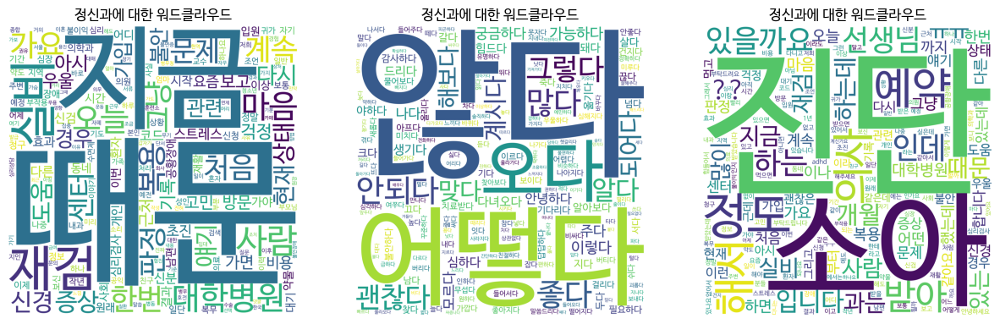

In [ ]:
wordclouds_maker('정신과', n_c, p_c, m_c)
save_jpgs(f_path)

# **추가조사: 아이 우울**

In [ ]:
keyword = input('검색어를 입력해주세요: ')
kids_depress = cafe_crawling(keyword)
kids_depress

검색어를 입력해주세요: 아이 우울


,title,description,link
0,adhd 아이 우울이요,제가 이번에 우울증 진단 받고 1년전 아이 adhd진단 받았을때 결과지를 다시 봤는...,http://cafe.naver.com/getampethskin/883498
1,초등우울 아이의 시,2년 전의 우울증이 없던 내 마음을 찾고 싶을 때 있는 힘껏 발을 옮기면 터벅터벅 ...,http://cafe.naver.com/koreanmania/642597
2,자폐아이랑 있으면서 우울해서 눈물날 때 없으세요?,먼저 말 걸지 않으면 한마디도 안하고 시키면 저만 알아듣는 발음으로 모기만한 소리로...,http://cafe.naver.com/loosebaby/404355
3,진짜우울하네요 아이충치,10살아이 한달전만 해도 충치없었는데 충치생겨서 충치치료3군데해야한다네요? 홈메우기...,http://cafe.naver.com/gpfleamarket/3584549
4,5학년 ad 아이 공개수업 후 우울 모드,거 같더라구요 자식은 다들 뜻대로 안 된다 안 된다 하지만 이제는 제 아이가 정상이...,http://cafe.naver.com/getampethskin/949660
...,...,...,...
995,아이들이많이빠쪄우울했는데,기대도안했는데 선물세트가 20세트가량들어왔네요 아이들이 많이나가우울했는데 기존학부모...,http://cafe.naver.com/sosoin22/24733
996,꽃멍,아이낳고 집에만 있으니 우울해서 인터넷으로 한단 샀는데 만원조금 넘는데 엄청 싱싱해...,http://cafe.naver.com/imsanbu/66302317
997,"본식 40일 앞두고 임신,,,우울해요",더 열심히 모으고 이사준비도 하기로했고 좀 더 큰집으로 가서 여유있게 아이 준비하고...,http://cafe.naver.com/imsanbu/64608215
998,어린 시절이 사라진 아이는 천국의 맛을 모릅니다 청년 자살률과 노인 자살률 둘 다...,우울한 아이는 우울한 어른이 되어 불안한 결혼을 하고 또 불안하게 자녀를 키웁니다 ...,http://cafe.naver.com/homaesilville/772480


In [ ]:
n_c, m_c = okts(kids_depress, 'description', keyword)

파일 이름을 입력해주세요: kids_depress_nouns


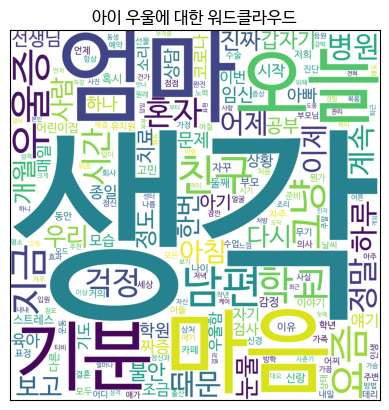

In [ ]:
wordclouds(n_c, keyword)
save_jpgs(f_path)

파일 이름을 입력해주세요: kids_depress_morphs


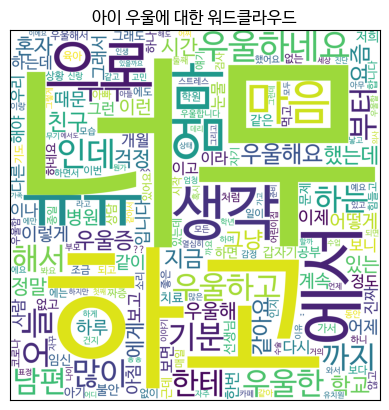

In [ ]:
wordclouds(m_c, keyword)
save_jpgs(f_path)

In [ ]:
# csv 파일로 저장
save_file_to_csv(kids_depress, f_path)

확장자명을 제외한 파일 이름을 입력하세요: kids_depress


# **추가조사: 아이 혹시**

In [ ]:
keyword = input('검색어를 입력해주세요: ')
kids_if = cafe_crawling(keyword)
kids_if

검색어를 입력해주세요: 아이 혹시


,title,description,link
0,혹시 아이 패드 학습지 시켜보신 분들 계실까요?,저희 아이는 6살이고 저희는 유치원때 까지는 놀아라 어차피 할 공부 유치원에서 배우...,http://cafe.naver.com/vidal04/921953
1,혹시 영화관 복지카드 할인되나요?(아이),아이가 초딩인데 어릴적 가보고 아이랑 영화본적이 없네요 초딩아이 혹시 복지카드 있음...,http://cafe.naver.com/getampethskin/943098
2,혹시 아이 문해력에관한 책이나 영상,아이가 초등학교 2학년인데 책을 굉장히 빨리 읽어요 근데 요즘엔 책내용을 제대로 ...,http://cafe.naver.com/malltail/6753642
3,혹시 아이가 증상없는 열날때,좋고잘놀고 잘먹어요! 4살 아이인데 어제 오전부터 38도 이상 열올ㄹㅏ서 해열제먹이...,http://cafe.naver.com/kyungmammo/6007012
4,혹시 아이 눈병같을땐 어디로 가야하나요?,5세 아이인데 갑자기 오늘 저녁부터 한쪽눈에서 노란색 눈꼽같은 이물질이 계속 나오더...,http://cafe.naver.com/3gumomclub/1298103
...,...,...,...
995,혹시 아이라인 잘지우는곳 궁금해요,8년전 아이라인 했는데 짝짝이로 되서요 34년뒤에 지워진다고했는데 아직까지 그대로에...,http://cafe.naver.com/yeosumam/1406734
996,혹시 아이옷 만들기 학원 이런 곳 있을까요?,미싱 이런거 아직 할 줄 모르는데요! 아이 옷을 만들어 주고 싶어요! 혹시 주변에 ...,http://cafe.naver.com/samwonmoms/977388
997,"혹시 초등아이들 팔토시, 앞치마 어디에 있을까요?","내일 방과후 준비물인데 계쇼문구점에 가보니 찾는 사이즈가 없고, 다이소 문의했더니 ...",http://cafe.naver.com/haemir119/223313
998,아이 방 매트리스 추천좀 해주세요,방이 엄청나게 넓은 편이 아니다보니 프레임 없이 매트리스만 쓰는게 더 방 넓게 쓸 ...,http://cafe.naver.com/imsanbu/66125868


In [ ]:
n_c, m_c = okts(kids_if, 'description', keyword)

파일 이름을 입력해주세요: kids_if


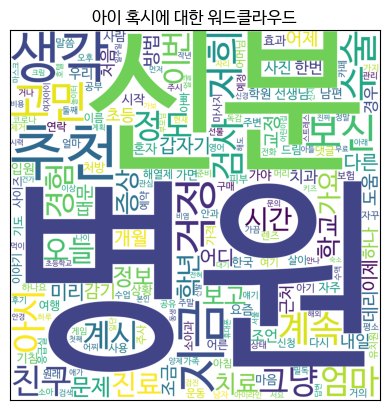

In [ ]:
wordclouds(n_c, keyword)
save_jpgs(f_path)

파일 이름을 입력해주세요: kids_if_morphs


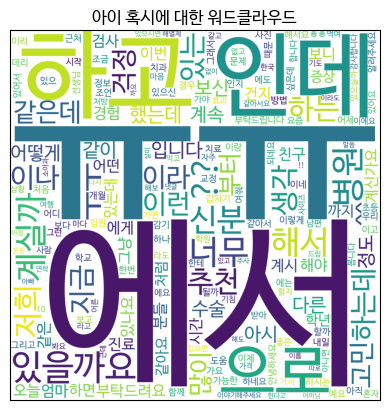

In [ ]:
wordclouds(m_c, keyword)
save_jpgs(f_path)

In [ ]:
# csv 파일로 저장
save_file_to_csv(kids_if, f_path)

확장자명을 제외한 파일 이름을 입력하세요: kids_if


# **추가조사: 요새 아이**

In [ ]:
keyword = input('검색어를 입력해주세요: ')
kids_these_days = cafe_crawling(keyword)
kids_these_days.head()

검색어를 입력해주세요: 요새 아이


,title,description,link
0,반말 찍찍하는 요새 아이들,"저희때는 부모님께나 선생님 어른들한테 어렸을때부터 존댓말 했는데, 요새 아이들 보면...",http://cafe.naver.com/unnammabook/433764
1,요새 아이들 체험학습이요,요새 초등학교 아이들 학교 내에서 체험학습 많이 가나요???? 보통 일학기에 몇번정...,http://cafe.naver.com/nepoengel/231790
2,"요새 아이들 영화, 뭐 하나요?",신랑이 아이들 데리고 영화보러 간다는데 요새 애들 영화 뭐하나요? 초딩 저학년 볼만...,http://cafe.naver.com/masanmam/6485722
3,요새 아이들 독감 어떤가요?,물론 아이들마다 다르겠지만 저희 애는 페라미플루 맞은지 24시간 지나도 여전히 39...,http://cafe.naver.com/seochom/863970
4,요새날씨 아이옷,요새 아이옷 등원시 어떻게 입히시나요 저희동네는 그렇게 바람이 잘불어서 아침엔 또 ...,http://cafe.naver.com/yimom/661640


In [ ]:
kids_these_days.dropna()

,title,description,link
0,반말 찍찍하는 요새 아이들,"저희때는 부모님께나 선생님 어른들한테 어렸을때부터 존댓말 했는데, 요새 아이들 보면...",http://cafe.naver.com/unnammabook/433764
1,요새 아이들 체험학습이요,요새 초등학교 아이들 학교 내에서 체험학습 많이 가나요???? 보통 일학기에 몇번정...,http://cafe.naver.com/nepoengel/231790
2,"요새 아이들 영화, 뭐 하나요?",신랑이 아이들 데리고 영화보러 간다는데 요새 애들 영화 뭐하나요? 초딩 저학년 볼만...,http://cafe.naver.com/masanmam/6485722
3,요새 아이들 독감 어떤가요?,물론 아이들마다 다르겠지만 저희 애는 페라미플루 맞은지 24시간 지나도 여전히 39...,http://cafe.naver.com/seochom/863970
4,요새날씨 아이옷,요새 아이옷 등원시 어떻게 입히시나요 저희동네는 그렇게 바람이 잘불어서 아침엔 또 ...,http://cafe.naver.com/yimom/661640
...,...,...,...
995,요새 예비초등아이들 휴대폰가방어떤걸로 하나요??,요새 예비초등아이들 휴대폰가방어떤걸로 하나요?? 혹시 아직은 카봇좋아하는 아이도 있...,http://cafe.naver.com/gumimom7/5490616
996,아픈아이가 다른곳도아파졌어요,똥 같지는않다며 요새 아이 먹는양 준거 컨디션 급 떨어져서 계속 졸려하는게 이상하다...,http://cafe.naver.com/mgm533/108948
997,요새 학생들 넘 안스러워요,학원에 도서관에 12시가 기본이고 새벽까지 공부하겠다고 잠도 많이 못자고 나가는데 ...,http://cafe.naver.com/3gumomclub/605456
998,요새 놀이터 가시나요??,말 그대로 요새 아이들과 놀이터 나가시나요?! 전 무서워서 당분간 안나가려고요ㅠ,http://cafe.naver.com/sjkdhj467/820955


In [ ]:
n_c, p_c, m_c = okts(kids_these_days, 'description', '요새 아이')

파일 이름을 입력해주세요: kids_these_days


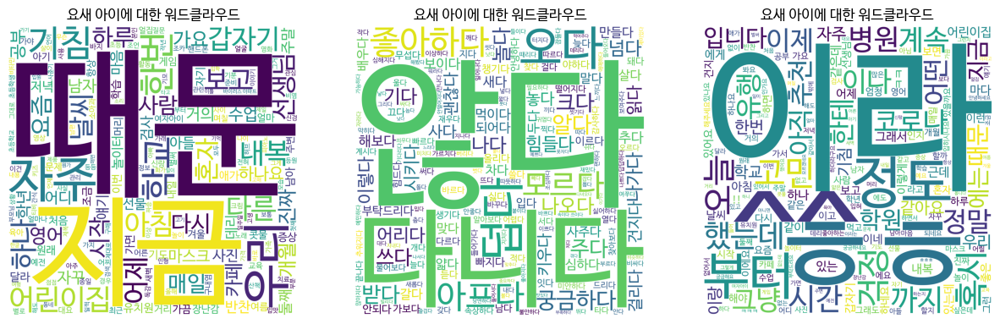

In [ ]:
wordclouds_maker('요새 아이', n_c, p_c, m_c)
save_jpgs(f_path)

In [ ]:
# csv 파일로 저장
save_file_to_csv(kids_these_days, f_path)

확장자명을 제외한 파일 이름을 입력하세요: kids_these_days


# **추가조사: 아이 갑자기**

In [ ]:
keyword = input('검색어를 입력해주세요: ')
kids_suddenly = cafe_crawling(keyword)
kids_suddenly.head()

검색어를 입력해주세요: 아이 갑자기


,title,description,link
0,잘자던 아이 갑자기 울면서 깨요,밤에도 항상 그시간에 책 읽고 안녕 하면 빠이빠이 하면서 잘자던 아이고 아무리 거실...,http://cafe.naver.com/momsofsongdoifez/1154651
1,9살아이 갑자기 머리카락이 빠지더니,항목 1) 50자 이상 나의 탈모 고민과 이마반에서 얻고 싶은 정보를 자유롭게 작성...,http://cafe.naver.com/imaban/1079340
2,2살 아이 갑자기 밤잠을 안자는데,근데 갑자기 일이주 전부터 9시가 되도 말똥말똥 하고 있어요 어제는 무려 10시에 ...,http://cafe.naver.com/japanmama/734147
3,아이 갑자기 코피 어디병원 가야할까요,어제 오늘 갑자기 자다가 코피흘러깨고 오늘은 밥먹으면서 주르륻 흐르네요 자기다 코피...,http://cafe.naver.com/3gumomclub/1293194
4,10개월 아이 갑자기 열나는데 383도,10개월 아이 갑자기 열나요 이유식 먹이고 양치질시키는데 이마가 뜨끈 뜨끈하길래 열...,http://cafe.naver.com/imsanbu/66041275


In [ ]:
kids_suddenly.dropna()

,title,description,link
0,잘자던 아이 갑자기 울면서 깨요,밤에도 항상 그시간에 책 읽고 안녕 하면 빠이빠이 하면서 잘자던 아이고 아무리 거실...,http://cafe.naver.com/momsofsongdoifez/1154651
1,9살아이 갑자기 머리카락이 빠지더니,항목 1) 50자 이상 나의 탈모 고민과 이마반에서 얻고 싶은 정보를 자유롭게 작성...,http://cafe.naver.com/imaban/1079340
2,2살 아이 갑자기 밤잠을 안자는데,근데 갑자기 일이주 전부터 9시가 되도 말똥말똥 하고 있어요 어제는 무려 10시에 ...,http://cafe.naver.com/japanmama/734147
3,아이 갑자기 코피 어디병원 가야할까요,어제 오늘 갑자기 자다가 코피흘러깨고 오늘은 밥먹으면서 주르륻 흐르네요 자기다 코피...,http://cafe.naver.com/3gumomclub/1293194
4,10개월 아이 갑자기 열나는데 383도,10개월 아이 갑자기 열나요 이유식 먹이고 양치질시키는데 이마가 뜨끈 뜨끈하길래 열...,http://cafe.naver.com/imsanbu/66041275
...,...,...,...
995,잘 놀다가 갑자기 우는 아이,이제 2갤 좀 넘었는데 요즘 들어서 잘 놀다가 갑자기 엄청 서럽게 30분을 울어요 ...,http://cafe.naver.com/imsanbu/66268431
996,갑자기 양쪽 다리가아프다는 아이,워낙 운동을 잘하는아이라 갑자기 근육통이 올일도없고아무래도 내일 아침에도 불편하다고...,http://cafe.naver.com/daechonmom/301011
997,날마다 놀래키는 아이,제작년 여름에 한 6개월된 아이가 갑자기 나타나 그때부터 밥을 주었지요 같이 의지하...,http://cafe.naver.com/icfc0520/209768
998,아이가 갑자기 골절상을 당했어요,지난 주말 놀이터에서 아이들이랑 놀다가 넘어졌어요 바닥이 딱딱한 콘트리트도 아니었고...,http://cafe.naver.com/q5q5q5/647228


In [ ]:
n_c, p_c, m_c = okts(kids_suddenly, 'description', '아이 갑자기')

파일 이름을 입력해주세요: kids_suddenly


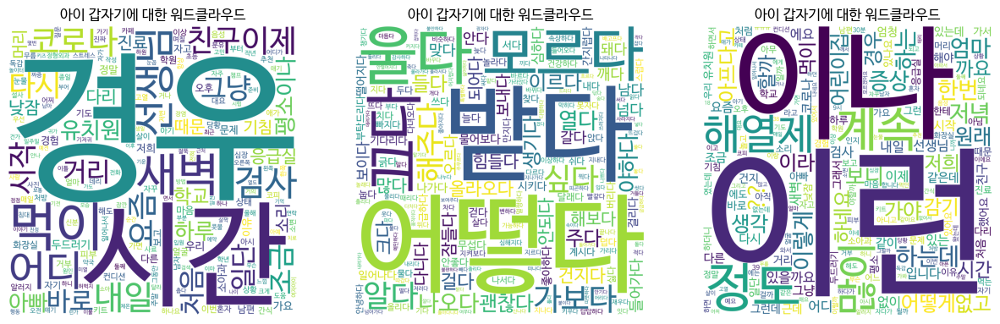

In [ ]:
wordclouds_maker('아이 갑자기', n_c, p_c, m_c)
save_jpgs(f_path)

In [ ]:
# csv 파일로 저장
save_file_to_csv(kids_suddenly, f_path)

확장자명을 제외한 파일 이름을 입력하세요: kids_suddenly
